In [1]:
import warnings
warnings.filterwarnings('ignore')

# Prepare the Dataset

In [2]:
dataset_name = 'CIFAR100'

In [3]:
import numpy as np
from skimage.color import grey2rgb
from keras.datasets import cifar100
(X, y), (X_test, y_test) = cifar100.load_data()
X = np.concatenate((X, X_test))
y = np.concatenate((y, y_test)).flatten()
imgs = X
del X_test
del y_test

imgs = X

#X = np.array(list(map(lambda x: grey2rgb(x), X)), dtype=np.float32)
X = X.astype(np.float32)/ 255.0

print('Dataset size {}'.format(X.shape))

Using TensorFlow backend.


Dataset size (60000, 32, 32, 3)


## Dimension Reduction for plotting

In [4]:
from sklearn.decomposition import PCA

In [5]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X.reshape((X.shape[0], -1)))


## Plotting the original data set

In [6]:
import random
randomindexs = list()
for i in range(6000):
    randomindexs.append(random.randint(0,len(X_pca)-1))

In [7]:
from _utils.plots import plot_dataset

In [8]:
labels = [
'apple', # id 0
'aquarium_fish',
'baby',
'bear',
'beaver',
'bed',
'bee',
'beetle',
'bicycle',
'bottle',
'bowl',
'boy',
'bridge',
'bus',
'butterfly',
'camel',
'can',
'castle',
'caterpillar',
'cattle',
'chair',
'chimpanzee',
'clock',
'cloud',
'cockroach',
'couch',
'crab',
'crocodile',
'cup',
'dinosaur',
'dolphin',
'elephant',
'flatfish',
'forest',
'fox',
'girl',
'hamster',
'house',
'kangaroo',
'computer_keyboard',
'lamp',
'lawn_mower',
'leopard',
'lion',
'lizard',
'lobster',
'man',
'maple_tree',
'motorcycle',
'mountain',
'mouse',
'mushroom',
'oak_tree',
'orange',
'orchid',
'otter',
'palm_tree',
'pear',
'pickup_truck',
'pine_tree',
'plain',
'plate',
'poppy',
'porcupine',
'possum',
'rabbit',
'raccoon',
'ray',
'road',
'rocket',
'rose',
'sea',
'seal',
'shark',
'shrew',
'skunk',
'skyscraper',
'snail',
'snake',
'spider',
'squirrel',
'streetcar',
'sunflower',
'sweet_pepper',
'table',
'tank',
'telephone',
'television',
'tiger',
'tractor',
'train',
'trout',
'tulip',
'turtle',
'wardrobe',
'whale',
'willow_tree',
'wolf',
'woman',
'worm',
]

mapping = {
'aquatic mammals': ['beaver', 'dolphin', 'otter', 'seal', 'whale'],
'fish': ['aquarium_fish', 'flatfish', 'ray', 'shark', 'trout'],
'flowers': ['orchid', 'poppy', 'rose', 'sunflower', 'tulip'],
'food containers': ['bottle', 'bowl', 'can', 'cup', 'plate'],
'fruit and vegetables': ['apple', 'mushroom', 'orange', 'pear', 'sweet_pepper'],
'household electrical device': ['clock', 'computer_keyboard', 'lamp', 'telephone', 'television'],
'household furniture': ['bed', 'chair', 'couch', 'table', 'wardrobe'],
'insects': ['bee', 'beetle', 'butterfly', 'caterpillar', 'cockroach'],
'large carnivores': ['bear', 'leopard', 'lion', 'tiger', 'wolf'],
'large man-made outdoor things': ['bridge', 'castle', 'house', 'road', 'skyscraper'],
'large natural outdoor scenes': ['cloud', 'forest', 'mountain', 'plain', 'sea'],
'large omnivores and herbivores': ['camel', 'cattle', 'chimpanzee', 'elephant', 'kangaroo'],
'medium-sized mammals': ['fox', 'porcupine', 'possum', 'raccoon', 'skunk'],
'non-insect invertebrates': ['crab', 'lobster', 'snail', 'spider', 'worm'],
'people': ['baby', 'boy', 'girl', 'man', 'woman'],
'reptiles': ['crocodile', 'dinosaur', 'lizard', 'snake', 'turtle'],
'small mammals': ['hamster', 'mouse', 'rabbit', 'shrew', 'squirrel'],
'trees': ['maple_tree', 'oak_tree', 'palm_tree', 'pine_tree', 'willow_tree'],
'vehicles 1': ['bicycle', 'bus', 'motorcycle', 'pickup_truck', 'train'],
'vehicles 2': ['lawn_mower', 'rocket', 'streetcar', 'tank', 'tractor'],
}

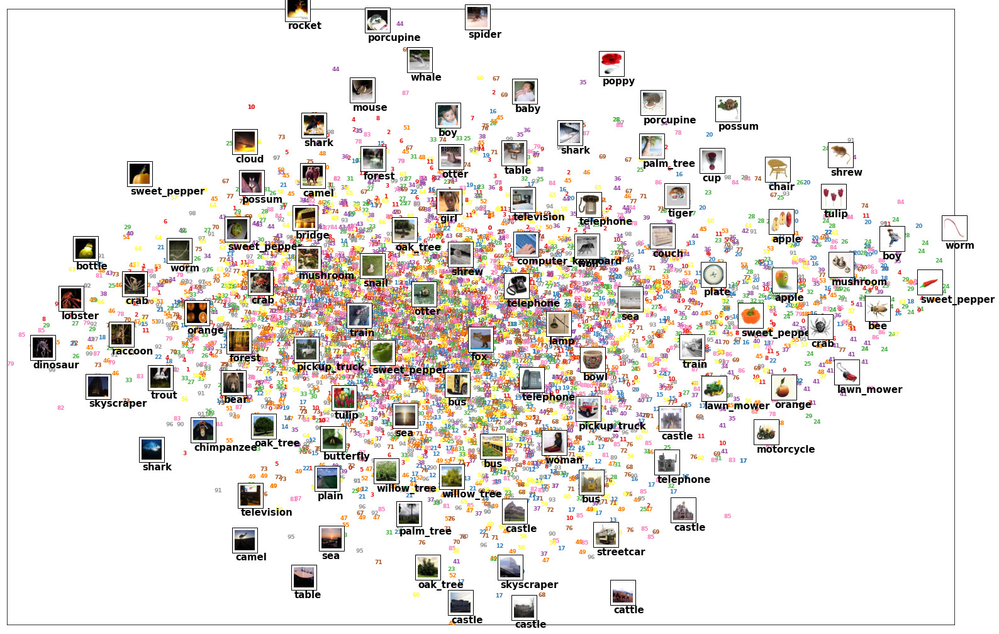

In [9]:
plot_dataset(X_pca[randomindexs], y[randomindexs],images=imgs[randomindexs], labels=labels)

## Linear Separability Analysis

https://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html

https://www.cs.waikato.ac.nz/~eibe/pubs/chains.pdf

In [10]:
%load_ext autoreload
%autoreload plot_dataset

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("white")

from _utils.plots import plot_transform_hyperplanes

cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0


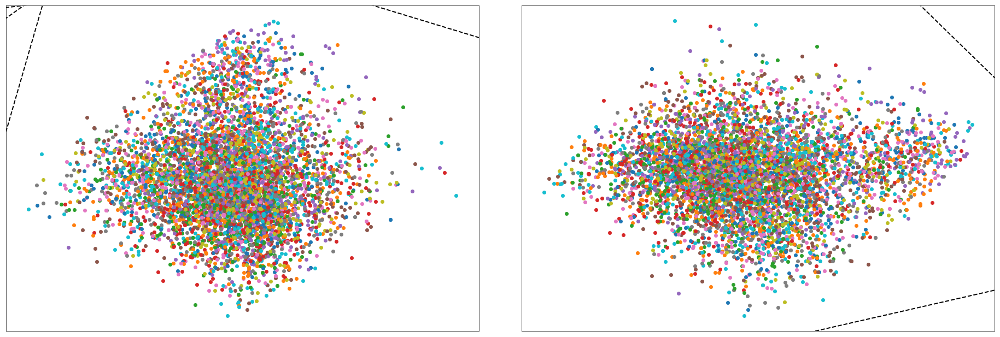

In [12]:
plot_transform_hyperplanes(X_pca[randomindexs], pd.get_dummies(y[randomindexs]).values) 

# tSNE embedding transforamtion

https://lvdmaaten.github.io/tsne/

https://github.com/KlugerLab/FIt-SNE

https://github.com/spotify/annoy

http://www.fftw.org/    

In [13]:
from FIt_SNE.fast_tsne import fast_tsne

In [14]:
Z_embedded1 = fast_tsne(X.reshape((X.shape[0], -1)), 
                         learning_rate=1000, max_iter=5000,
                         n_trees=500, perplexity=100,
                         initialization=X_pca, 
                         df=1,
                         early_exag_coeff=15,  
                         late_exag_coeff=5)

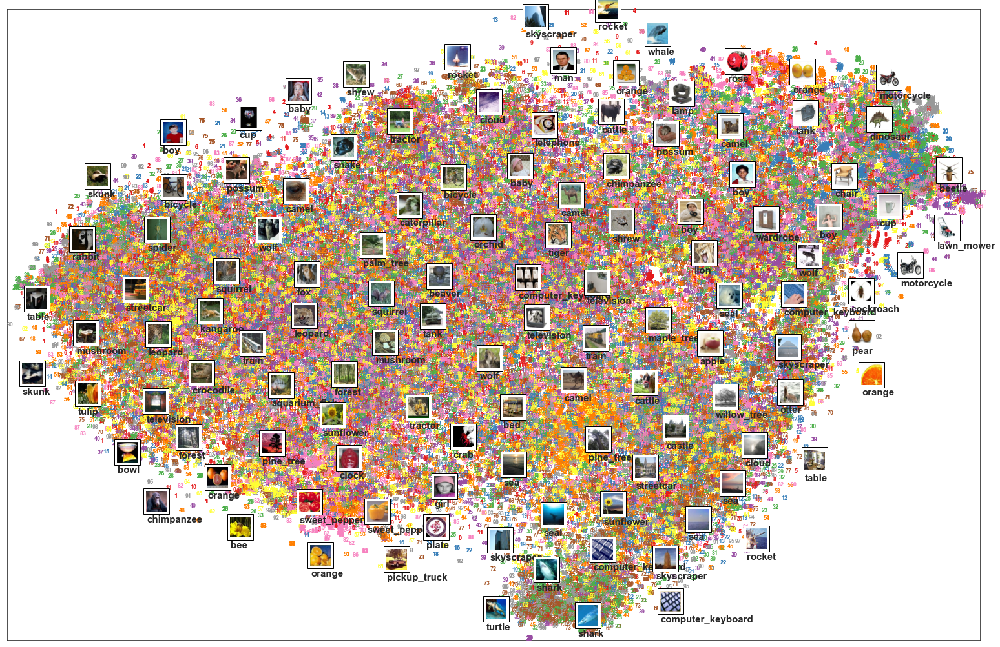

In [15]:
plot_dataset(Z_embedded1, y,images=imgs, labels=labels)

In [16]:
Z_embedded = fast_tsne(X.reshape((X.shape[0], -1)), 
                         learning_rate=1000, max_iter=5000,
                         n_trees=500, perplexity=100,
                         initialization=X_pca, 
                         df=0.4,
                         early_exag_coeff=15,  
                         late_exag_coeff=5)

In [15]:
#Z1 = fast_tsne(X.reshape((X.shape[0], -1)), 
#                         learning_rate=1000,
#                         n_trees=100,
#                         initialization=X_pca, 
#                         df=0.4,
#                         late_exag_coeff=5)
#

#=============== t-SNE v1.1.0 ===============
#fast_tsne data_path: data.dat
#fast_tsne result_path: result.dat
#fast_tsne nthreads: 12
#Read the following parameters:
##########n 60000 by d 3072 dataset, theta 0.500000,
##########perplexity 100.000000, no_dims 2, max_iter 5000,
##########stop_lying_iter 250, mom_switch_iter 250,
##########momentum 0.500000, final_momentum 0.800000,
##########learning_rate 1000.000000, K -1, sigma -1.000000, nbody_algo 2,
##########knn_algo 1, early_exag_coeff 15.000000,
##########no_momentum_during_exag 0, n_trees 500, search_k 150000,
##########start_late_exag_iter -1, late_exag_coeff 5.000000
##########nterms 3, interval_per_integer 1.000000, min_num_intervals 50, t-dist df 0.400000
#Read the 60000 x 3072 data matrix successfully. X[0,0] = 1.000000
#Read the initialization successfully.
#Will use momentum during exaggeration phase
#Computing input similarities...
#Using perplexity, so normalizing input data (to prevent numerical problems)
#Using perplexity, not the manually set kernel width.  K (number of nearest neighbors) and sigma (bandwidth) parameters are going to be ignored.
#Using ANNOY for knn search, with parameters: n_trees 500 and search_k 150000
#Going to allocate memory. N: 60000, K: 300, N*K = 18000000
#Building Annoy tree...
#[===========================================================>] 99% 862.312s
#Symmetrizing...
#Using the given initialization.
#Exaggerating Ps by 15.000000
#Input similarities computed (sparsity = 0.009175)!
#Learning embedding...
#Using FIt-SNE approximation.
#Iteration 50 (50 iterations in 2.49 seconds), cost 4.783771
#Iteration 100 (50 iterations in 2.43 seconds), cost 5.036851
#Iteration 150 (50 iterations in 2.42 seconds), cost 5.441194
#Iteration 200 (50 iterations in 2.41 seconds), cost 5.480036
#Iteration 250 (50 iterations in 2.55 seconds), cost 5.520191
#Unexaggerating Ps by 15.000000
#Iteration 300 (50 iterations in 2.46 seconds), cost 4.931851
#Iteration 350 (50 iterations in 2.44 seconds), cost 4.766650
#Iteration 400 (50 iterations in 2.45 seconds), cost 4.684933
#Iteration 450 (50 iterations in 2.44 seconds), cost 4.627100
#Iteration 500 (50 iterations in 2.44 seconds), cost 4.578303
#Iteration 550 (50 iterations in 2.55 seconds), cost 4.539945
#Iteration 600 (50 iterations in 2.43 seconds), cost 4.506375
#Iteration 650 (50 iterations in 2.52 seconds), cost 4.477900
#Iteration 700 (50 iterations in 2.60 seconds), cost 4.450135
#Iteration 750 (50 iterations in 2.71 seconds), cost 4.423212
#Iteration 800 (50 iterations in 3.03 seconds), cost 4.405884
#Iteration 850 (50 iterations in 3.26 seconds), cost 4.387594
#Iteration 900 (50 iterations in 3.46 seconds), cost 4.373092
#Iteration 950 (50 iterations in 3.48 seconds), cost 4.356256
#Iteration 1000 (50 iterations in 4.86 seconds), cost 4.342865
#Iteration 1050 (50 iterations in 4.56 seconds), cost 4.329035
#Iteration 1100 (50 iterations in 3.85 seconds), cost 4.314554
#Iteration 1150 (50 iterations in 4.05 seconds), cost 4.307161
#Iteration 1200 (50 iterations in 4.76 seconds), cost 4.298550
#Iteration 1250 (50 iterations in 4.91 seconds), cost 4.290746
#Iteration 1300 (50 iterations in 5.10 seconds), cost 4.276406
#Iteration 1350 (50 iterations in 5.30 seconds), cost 4.272611
#Iteration 1400 (50 iterations in 5.56 seconds), cost 4.265220
#Iteration 1450 (50 iterations in 5.88 seconds), cost 4.260829
#Iteration 1500 (50 iterations in 6.03 seconds), cost 4.253950
#Iteration 1550 (50 iterations in 6.70 seconds), cost 4.246843
#Iteration 1600 (50 iterations in 6.54 seconds), cost 4.241047
#Iteration 1650 (50 iterations in 7.48 seconds), cost 4.235922
#Iteration 1700 (50 iterations in 7.42 seconds), cost 4.233002
#Iteration 1750 (50 iterations in 8.22 seconds), cost 4.226147
#Iteration 1800 (50 iterations in 10.05 seconds), cost 4.225918
#Iteration 1850 (50 iterations in 25.18 seconds), cost 4.217176
#Iteration 1900 (50 iterations in 10.12 seconds), cost 4.214233
#Iteration 1950 (50 iterations in 18.70 seconds), cost 4.212227
#Iteration 2000 (50 iterations in 9.69 seconds), cost 4.205880
#Iteration 2050 (50 iterations in 9.06 seconds), cost 4.203232
#Iteration 2100 (50 iterations in 9.85 seconds), cost 4.201016
#Iteration 2150 (50 iterations in 11.12 seconds), cost 4.195543
#Iteration 2200 (50 iterations in 11.12 seconds), cost 4.190137
#Iteration 2250 (50 iterations in 11.19 seconds), cost 4.189200
#Iteration 2300 (50 iterations in 11.13 seconds), cost 4.188869
#Iteration 2350 (50 iterations in 11.16 seconds), cost 4.182862
#Iteration 2400 (50 iterations in 11.21 seconds), cost 4.183876
#Iteration 2450 (50 iterations in 11.07 seconds), cost 4.180957
#Iteration 2500 (50 iterations in 11.18 seconds), cost 4.177938
#Iteration 2550 (50 iterations in 11.14 seconds), cost 4.171639
#Iteration 2600 (50 iterations in 13.51 seconds), cost 4.173847
#Iteration 2650 (50 iterations in 26.29 seconds), cost 4.174616
#Iteration 2700 (50 iterations in 16.51 seconds), cost 4.172318
#Iteration 2750 (50 iterations in 28.41 seconds), cost 4.168756
#Iteration 2800 (50 iterations in 22.77 seconds), cost 4.167809
#Iteration 2850 (50 iterations in 14.20 seconds), cost 4.168003
#Iteration 2900 (50 iterations in 17.00 seconds), cost 4.165645
#Iteration 2950 (50 iterations in 13.85 seconds), cost 4.167986
#Iteration 3000 (50 iterations in 28.71 seconds), cost 4.164535
#Iteration 3050 (50 iterations in 29.39 seconds), cost 4.164068
#Iteration 3100 (50 iterations in 29.40 seconds), cost 4.164378
#Iteration 3150 (50 iterations in 26.83 seconds), cost 4.163471
#Iteration 3200 (50 iterations in 20.31 seconds), cost 4.162635
#Iteration 3250 (50 iterations in 14.88 seconds), cost 4.163311
#Iteration 3300 (50 iterations in 23.41 seconds), cost 4.161869
#Iteration 3350 (50 iterations in 35.89 seconds), cost 4.159983
#Iteration 3400 (50 iterations in 34.08 seconds), cost 4.158476
#Iteration 3450 (50 iterations in 14.26 seconds), cost 4.157028
#Iteration 3500 (50 iterations in 20.18 seconds), cost 4.157868
#Iteration 3550 (50 iterations in 28.32 seconds), cost 4.156785
#Iteration 3600 (50 iterations in 38.48 seconds), cost 4.155740
#Iteration 3650 (50 iterations in 30.87 seconds), cost 4.155465
#Iteration 3700 (50 iterations in 14.64 seconds), cost 4.153938
#Iteration 3750 (50 iterations in 25.54 seconds), cost 4.149395
#Iteration 3800 (50 iterations in 32.07 seconds), cost 4.157479
#Iteration 3850 (50 iterations in 21.75 seconds), cost 4.151468
#Iteration 3900 (50 iterations in 31.71 seconds), cost 4.149913
#Iteration 3950 (50 iterations in 20.09 seconds), cost 4.148561
#Iteration 4000 (50 iterations in 16.50 seconds), cost 4.146461
#Iteration 4050 (50 iterations in 24.60 seconds), cost 4.150546
#Iteration 4100 (50 iterations in 28.47 seconds), cost 4.148301
#Iteration 4150 (50 iterations in 17.54 seconds), cost 4.148208
#Iteration 4200 (50 iterations in 29.52 seconds), cost 4.145638
#Iteration 4250 (50 iterations in 28.81 seconds), cost 4.145974
#Iteration 4300 (50 iterations in 28.52 seconds), cost 4.146104
#Iteration 4350 (50 iterations in 27.83 seconds), cost 4.147423
#Iteration 4400 (50 iterations in 21.14 seconds), cost 4.144491
#Iteration 4450 (50 iterations in 29.05 seconds), cost 4.143405
#Iteration 4500 (50 iterations in 29.43 seconds), cost 4.143591
#Iteration 4550 (50 iterations in 14.01 seconds), cost 4.143725
#Iteration 4600 (50 iterations in 38.31 seconds), cost 4.141327
#Iteration 4650 (50 iterations in 25.08 seconds), cost 4.141985
#Iteration 4700 (50 iterations in 18.28 seconds), cost 4.140258
#Iteration 4750 (50 iterations in 17.59 seconds), cost 4.139819
#Iteration 4800 (50 iterations in 41.30 seconds), cost 4.141085
#Iteration 4850 (50 iterations in 30.92 seconds), cost 4.141081
#Iteration 4900 (50 iterations in 20.93 seconds), cost 4.140712
#Iteration 4950 (50 iterations in 41.32 seconds), cost 4.137092
#Iteration 5000 (50 iterations in 29.18 seconds), cost 4.138193
#Wrote the 60000 x 2 data matrix successfully.
#Done.

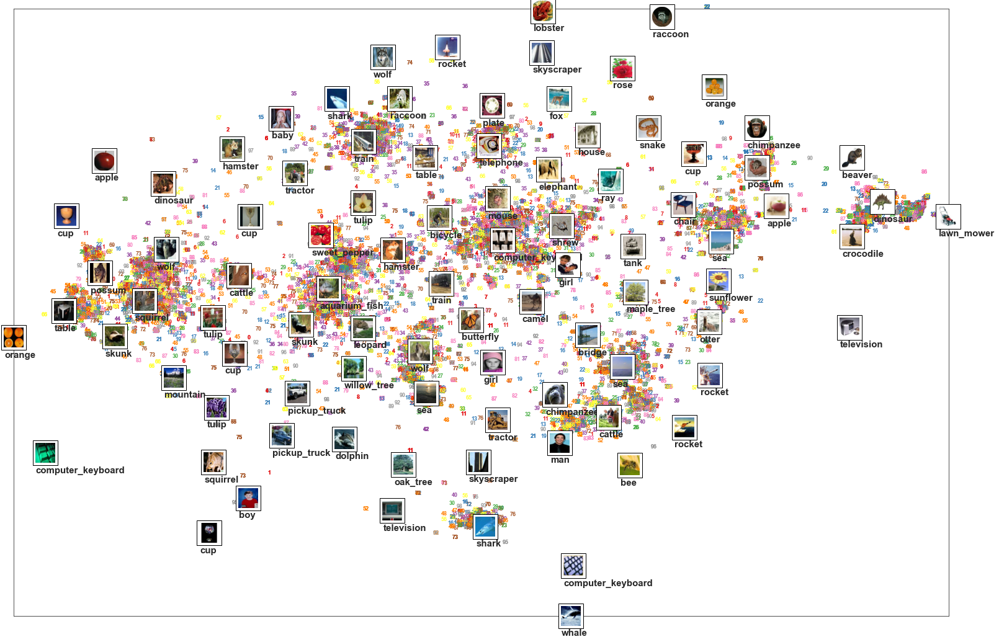

In [17]:
plot_dataset(Z_embedded, y,images=imgs, labels=labels)

https://en.wikipedia.org/wiki/Accuracy_and_precision

https://scikit-learn.org/stable/modules/model_evaluation.html#accuracy-score

https://kite.com/python/docs/sklearn.utils.linear_assignment_.linear_assignment

cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0


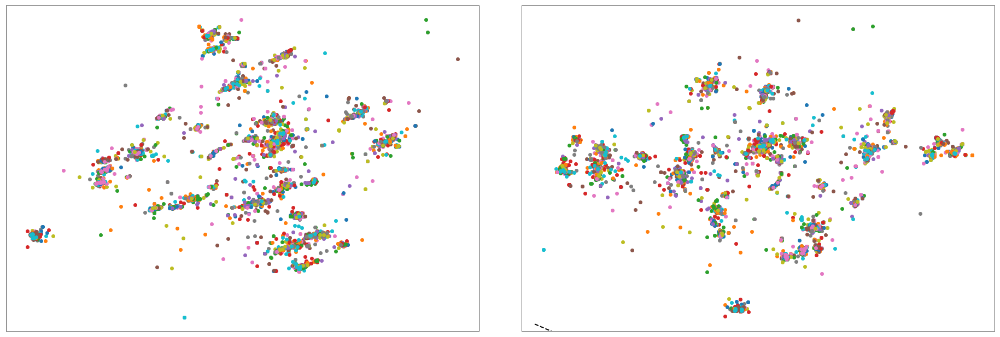

In [18]:
plot_transform_hyperplanes(Z_embedded[randomindexs], pd.get_dummies(y[randomindexs]).values)

In [19]:
from _utils.evaluate import evaluate_clustering 

# Clustering The Z-space

In [20]:
n_clusters = len(np.unique(y[randomindexs]))

In [21]:
# estimate bandwidth for mean shift
from sklearn import cluster, mixture
import hdbscan

from sklearn.neighbors import kneighbors_graph
# connectivity matrix for structured Ward
connectivity = kneighbors_graph(Z_embedded, n_neighbors=n_clusters, include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

# ============
# Create cluster objects
# ============
two_means = cluster.MiniBatchKMeans(n_clusters=n_clusters)
ward = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
spectral = cluster.SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack', affinity="nearest_neighbors")
dbscan = cluster.DBSCAN(eps=0.2)
affinity_propagation = cluster.AffinityPropagation()
birch = cluster.Birch(n_clusters=n_clusters)
gmm = mixture.GaussianMixture(n_components=n_clusters, covariance_type='full')
hdbscan_ = hdbscan.HDBSCAN(min_cluster_size=n_clusters, gen_min_span_tree=False)

clustering_algorithms = (
    ('MiniBatchKMeans', two_means),
    ('SpectralClustering', spectral),
    ('Ward', ward),
    ('Birch', birch),
    ('GaussianMixture', gmm),
    ('DBSCAN', dbscan),
    ('HDBSCAN', hdbscan_)
)


## MiniBatch KMeans

In [22]:
import time
for name, algorithm in [clustering_algorithms[0]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting MiniBatchKMeans


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.02285
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.027133333333333332


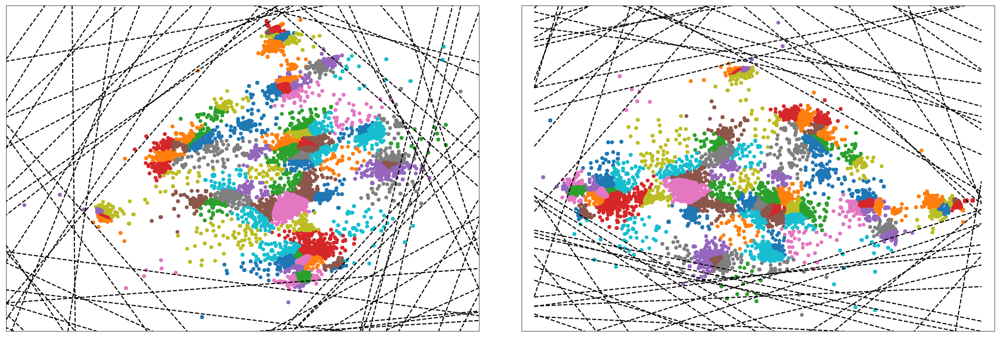

In [24]:
for name, algorithm in [clustering_algorithms[0]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [25]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by MiniBatchKMeans for n_clusters 100
n_clusters orignial 100
n_clusters detected 100
n unclustered points 0 out of 60000
Clustering using MiniBatchKMeans, time elapesd 0.19168925285339355
Clustering Accuracy 0.08306666666666666
Clustering purity 0.08775
Clustering homogeneity 0.1455770616546028
Clustering adjusted_rand_score 0.025308630750067087
Clustering adjusted_mutual_info_score 0.12932620022001065
Clustering completeness_score 0.15650321660344857
Clustering v_measure_score 0.15084254122118707


## Spectral Clustering

In [26]:
import time
for name, algorithm in [clustering_algorithms[1]]:
    t0 = time.time()
    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting SpectralClustering


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.043633333333333336
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0445


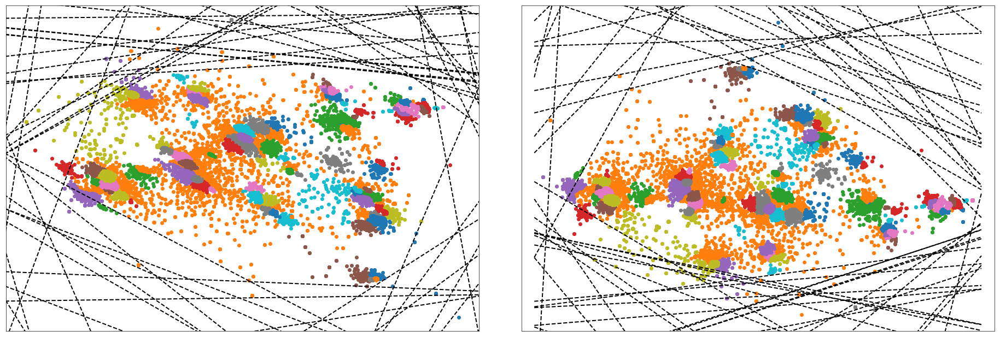

In [27]:
for name, algorithm in [clustering_algorithms[1]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [28]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by SpectralClustering for n_clusters 100
n_clusters orignial 100
n_clusters detected 100
n unclustered points 0 out of 60000
Clustering using SpectralClustering, time elapesd 123.11248230934143
Clustering Accuracy 0.07985
Clustering purity 0.0904
Clustering homogeneity 0.14804969302277401
Clustering adjusted_rand_score 0.021076593944103945
Clustering adjusted_mutual_info_score 0.1317656666236225
Clustering completeness_score 0.156788188157928
Clustering v_measure_score 0.15229369156137315


## Ward

In [29]:
import time
for name, algorithm in [clustering_algorithms[2]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Ward


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.08098333333333334
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0914


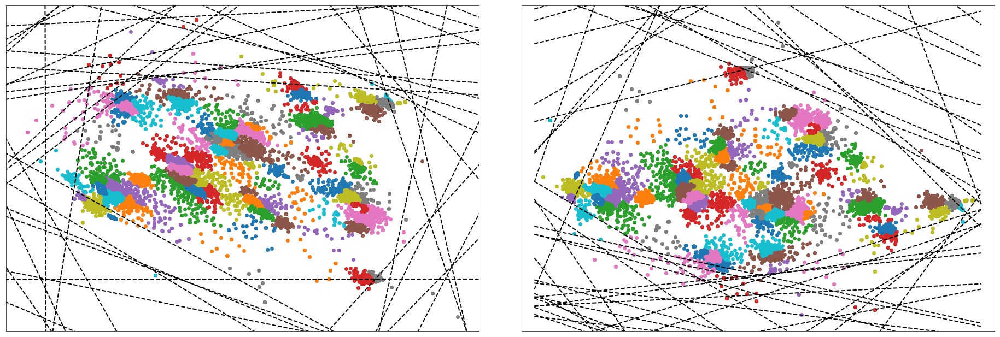

In [30]:
for name, algorithm in [clustering_algorithms[2]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [31]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Ward for n_clusters 100
n_clusters orignial 100
n_clusters detected 100
n unclustered points 0 out of 60000
Clustering using Ward, time elapesd 44.25054621696472
Clustering Accuracy 0.0791
Clustering purity 0.08213333333333334
Clustering homogeneity 0.14022461853744797
Clustering adjusted_rand_score 0.024805443383497505
Clustering adjusted_mutual_info_score 0.12425933478858844
Clustering completeness_score 0.1575757662278123
Clustering v_measure_score 0.14839471565799436


## Birch

In [32]:
import time
for name, algorithm in [clustering_algorithms[3]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Birch


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.18251666666666666
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.18315


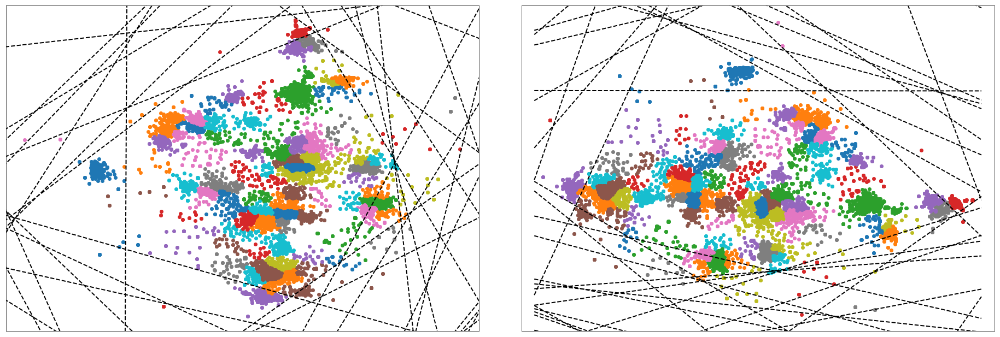

In [33]:
for name, algorithm in [clustering_algorithms[3]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [34]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Birch for n_clusters 100
n_clusters orignial 100
n_clusters detected 100
n unclustered points 0 out of 60000
Clustering using Birch, time elapesd 3.3461384773254395
Clustering Accuracy 0.06993333333333333
Clustering purity 0.07198333333333333
Clustering homogeneity 0.12804661242122498
Clustering adjusted_rand_score 0.023736528019952623
Clustering adjusted_mutual_info_score 0.1127929024151968
Clustering completeness_score 0.15175035500001205
Clustering v_measure_score 0.1388944209835992


## Gaussian Mixture

In [35]:
import time
for name, algorithm in [clustering_algorithms[4]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting GaussianMixture


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.023966666666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.028316666666666667


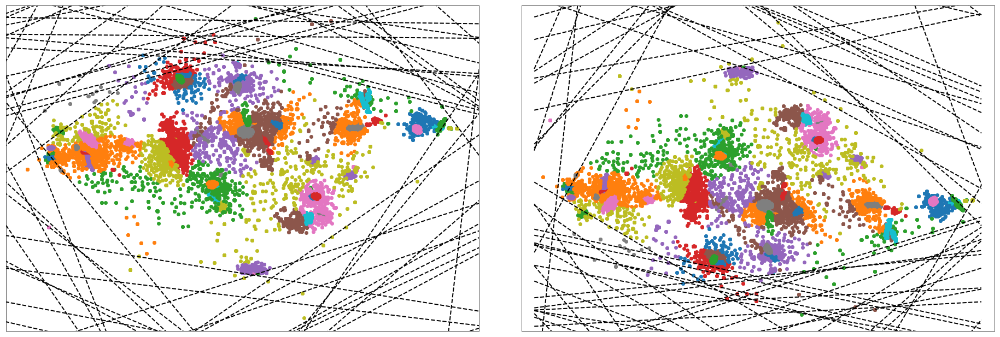

In [36]:
for name, algorithm in [clustering_algorithms[4]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [37]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by GaussianMixture for n_clusters 100
n_clusters orignial 100
n_clusters detected 100
n unclustered points 0 out of 60000
Clustering using GaussianMixture, time elapesd 20.121976375579834
Clustering Accuracy 0.0807
Clustering purity 0.08501666666666667
Clustering homogeneity 0.1436127890721909
Clustering adjusted_rand_score 0.02468817163183721
Clustering adjusted_mutual_info_score 0.12746869239892641
Clustering completeness_score 0.15396172703146943
Clustering v_measure_score 0.14860730225741717


## DBSCAN

In [38]:
import time
for name, algorithm in [clustering_algorithms[5]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting DBSCAN


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.07678333333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.08043333333333333


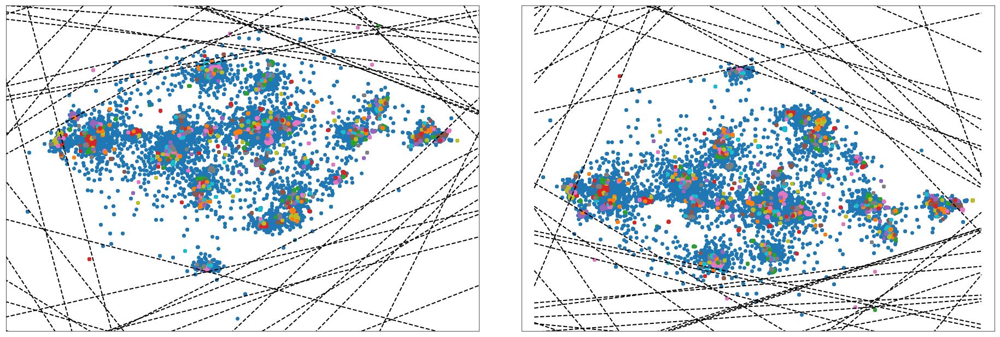

In [40]:
for name, algorithm in [clustering_algorithms[5]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [41]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by DBSCAN for n_clusters 100
n_clusters orignial 100
n_clusters detected 526
n unclustered points 8343 out of 60000
Clustering using DBSCAN, time elapesd 0.5827381610870361
Clustering Accuracy 0.08535145285246917
Clustering purity 0.11669280058849721
Clustering homogeneity 0.19761257117752803
Clustering adjusted_rand_score 0.028005266655495787
Clustering adjusted_mutual_info_score 0.14686524993082145
Clustering completeness_score 0.20530297317282206
Clustering v_measure_score 0.20138437927227207


## HDBSCAN

In [42]:
import time
for name, algorithm in [clustering_algorithms[6]]:
    t0 = time.time()
    
    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting HDBSCAN


C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.09601666666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.10378333333333334


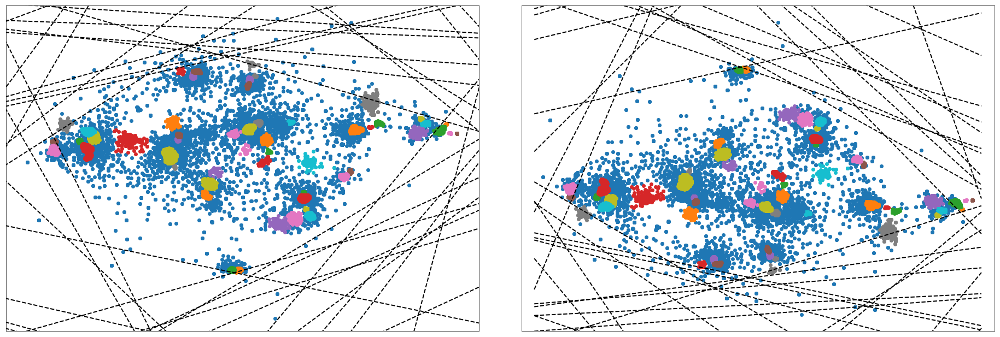

In [43]:
for name, algorithm in [clustering_algorithms[6]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [44]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by HDBSCAN for n_clusters 100
n_clusters orignial 100
n_clusters detected 59
n unclustered points 9019 out of 60000
Clustering using HDBSCAN, time elapesd 1.8617274761199951
Clustering Accuracy 0.08171671799297778
Clustering purity 0.0847766815087974
Clustering homogeneity 0.1407233476823471
Clustering adjusted_rand_score 0.026265713265033828
Clustering adjusted_mutual_info_score 0.12964054049053128
Clustering completeness_score 0.1719537354956975
Clustering v_measure_score 0.1547788859963275


# Choose number of clusters equals to Harmonic Mean of STD

In [45]:
from scipy.stats import hmean
n_clusters = int(hmean(X.reshape((X.shape[0], -1)).std(axis=1))*255)

In [46]:

# estimate bandwidth for mean shift
from sklearn import cluster, mixture
import hdbscan

from sklearn.neighbors import kneighbors_graph
# connectivity matrix for structured Ward
connectivity = kneighbors_graph(Z_embedded, n_neighbors=n_clusters, include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

# ============
# Create cluster objects
# ============
two_means = cluster.MiniBatchKMeans(n_clusters=n_clusters)
ward = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
spectral = cluster.SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack', affinity="nearest_neighbors")
dbscan = cluster.DBSCAN(eps=0.2)
affinity_propagation = cluster.AffinityPropagation()
birch = cluster.Birch(n_clusters=n_clusters)
gmm = mixture.GaussianMixture(n_components=n_clusters, covariance_type='full')
hdbscan_ = hdbscan.HDBSCAN(min_cluster_size=n_clusters, gen_min_span_tree=False)

clustering_algorithms = (
    ('MiniBatchKMeans', two_means),
    ('SpectralClustering', spectral),
    ('Ward', ward),
    ('Birch', birch),
    ('GaussianMixture', gmm),
    ('DBSCAN', dbscan),
    ('HDBSCAN', hdbscan_)
)


## MiniBatch KMeans

In [47]:
import time
for name, algorithm in [clustering_algorithms[0]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting MiniBatchKMeans


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13065
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13318333333333332


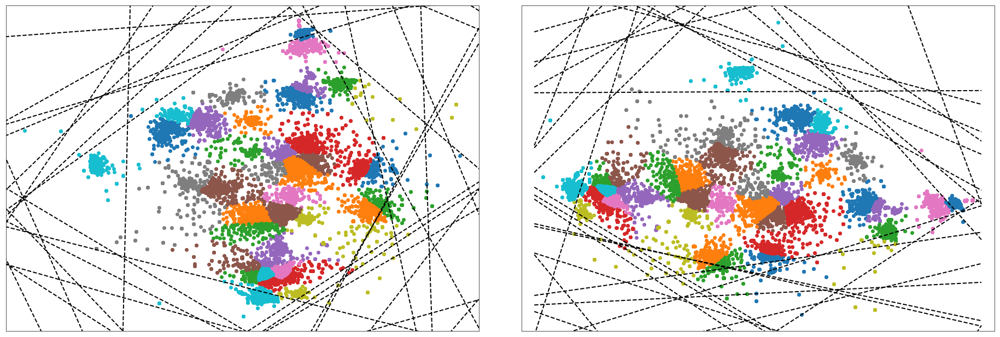

In [48]:
for name, algorithm in [clustering_algorithms[0]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values) 

### Clustering Metrics

In [49]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by MiniBatchKMeans for n_clusters 50
n_clusters orignial 100
n_clusters detected 50
n unclustered points 0 out of 60000
Clustering using MiniBatchKMeans, time elapesd 0.1470050811767578
Clustering Accuracy 0.06948333333333333
Clustering purity 0.07028333333333334
Clustering homogeneity 0.11730838086310542
Clustering adjusted_rand_score 0.023411672799886086
Clustering adjusted_mutual_info_score 0.1091662564012578
Clustering completeness_score 0.1471914853263905
Clustering v_measure_score 0.13056184163135978


## Spectral Clustering

In [50]:
import time
for name, algorithm in [clustering_algorithms[1]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting SpectralClustering


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.07808333333333334
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.08168333333333333


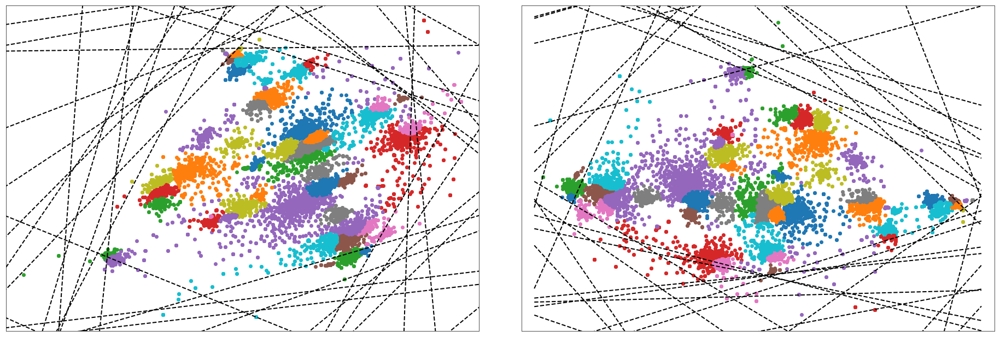

In [51]:
for name, algorithm in [clustering_algorithms[1]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)
    

### Clustering Metrics

In [52]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by SpectralClustering for n_clusters 50
n_clusters orignial 100
n_clusters detected 50
n unclustered points 0 out of 60000
Clustering using SpectralClustering, time elapesd 63.533366680145264
Clustering Accuracy 0.07035
Clustering purity 0.07216666666666667
Clustering homogeneity 0.11965065244866535
Clustering adjusted_rand_score 0.020120492909913124
Clustering adjusted_mutual_info_score 0.1116758094162329
Clustering completeness_score 0.1497723645898758
Clustering v_measure_score 0.1330276925775388


## Ward

In [53]:
import time
for name, algorithm in [clustering_algorithms[2]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Ward


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.19146666666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.1934


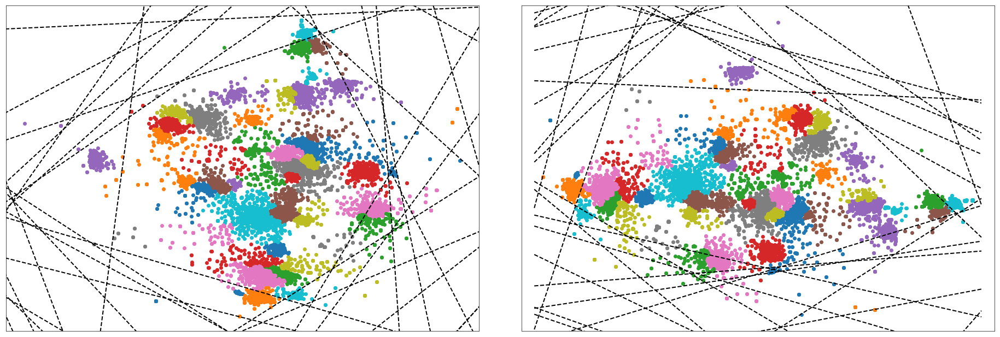

In [54]:
for name, algorithm in [clustering_algorithms[2]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [55]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Ward for n_clusters 50
n_clusters orignial 100
n_clusters detected 50
n unclustered points 0 out of 60000
Clustering using Ward, time elapesd 21.670921087265015
Clustering Accuracy 0.06745
Clustering purity 0.06798333333333334
Clustering homogeneity 0.11573963922068833
Clustering adjusted_rand_score 0.0229381218913889
Clustering adjusted_mutual_info_score 0.10768306862742624
Clustering completeness_score 0.14682083051730227
Clustering v_measure_score 0.1294405816009677


## Birch

In [56]:
import time
for name, algorithm in [clustering_algorithms[3]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Birch


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.21266666666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.21445


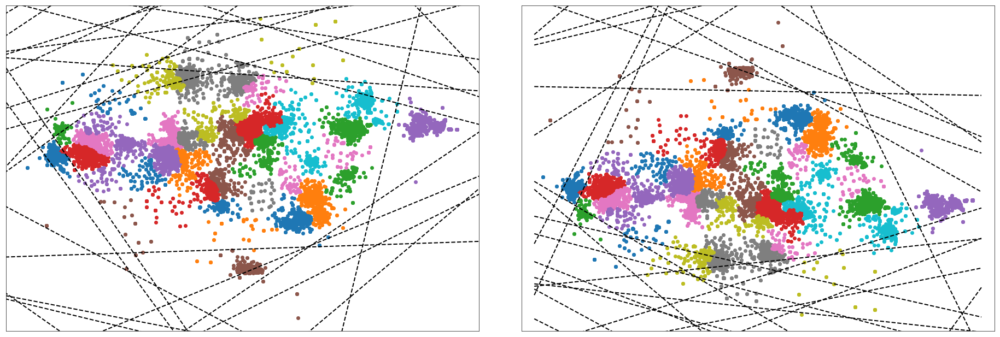

In [57]:
for name, algorithm in [clustering_algorithms[3]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [58]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Birch for n_clusters 50
n_clusters orignial 100
n_clusters detected 50
n unclustered points 0 out of 60000
Clustering using Birch, time elapesd 3.4918787479400635
Clustering Accuracy 0.06023333333333333
Clustering purity 0.060616666666666666
Clustering homogeneity 0.10524336628576543
Clustering adjusted_rand_score 0.021093459228274315
Clustering adjusted_mutual_info_score 0.09693920393976867
Clustering completeness_score 0.14287503735828078
Clustering v_measure_score 0.12120543795986799


## Gaussian Mixture

In [59]:
import time
for name, algorithm in [clustering_algorithms[4]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting GaussianMixture


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13716666666666666
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13913333333333333


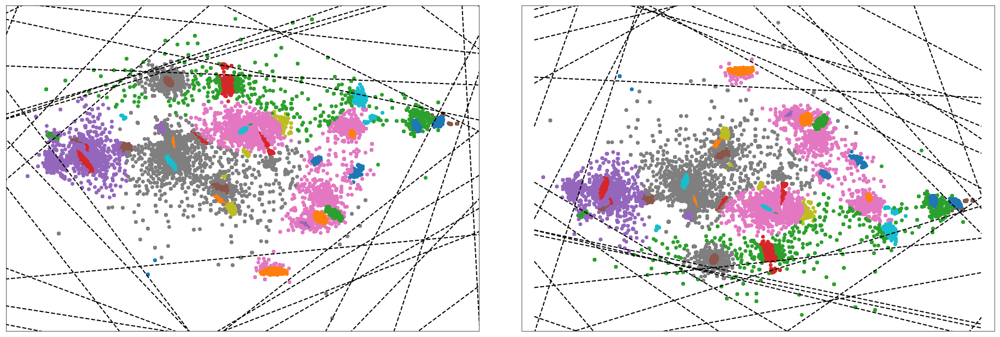

In [60]:
for name, algorithm in [clustering_algorithms[4]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [61]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by GaussianMixture for n_clusters 50
n_clusters orignial 100
n_clusters detected 50
n unclustered points 0 out of 60000
Clustering using GaussianMixture, time elapesd 11.369352102279663
Clustering Accuracy 0.07016666666666667
Clustering purity 0.07063333333333334
Clustering homogeneity 0.11651808912006968
Clustering adjusted_rand_score 0.023369011653953397
Clustering adjusted_mutual_info_score 0.10853143167003723
Clustering completeness_score 0.1436693662395513
Clustering v_measure_score 0.12867707242984855


## DBSCAN

In [62]:
import time
for name, algorithm in [clustering_algorithms[5]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting DBSCAN


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.07678333333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.08043333333333333


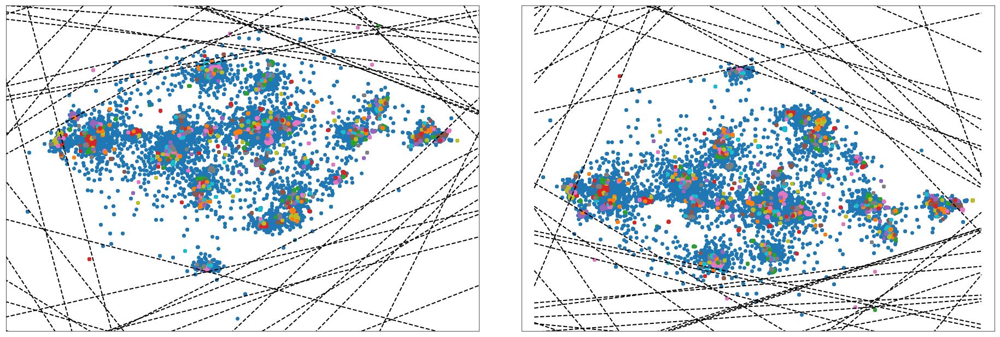

In [63]:
for name, algorithm in [clustering_algorithms[5]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [64]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by DBSCAN for n_clusters 50
n_clusters orignial 100
n_clusters detected 526
n unclustered points 8343 out of 60000
Clustering using DBSCAN, time elapesd 0.4476161003112793
Clustering Accuracy 0.08535145285246917
Clustering purity 0.11669280058849721
Clustering homogeneity 0.19761257117752803
Clustering adjusted_rand_score 0.028005266655495787
Clustering adjusted_mutual_info_score 0.14686524993082145
Clustering completeness_score 0.20530297317282206
Clustering v_measure_score 0.20138437927227207


## HDBSCAN

In [65]:
import time
for name, algorithm in [clustering_algorithms[6]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting HDBSCAN


C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.09088333333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0979


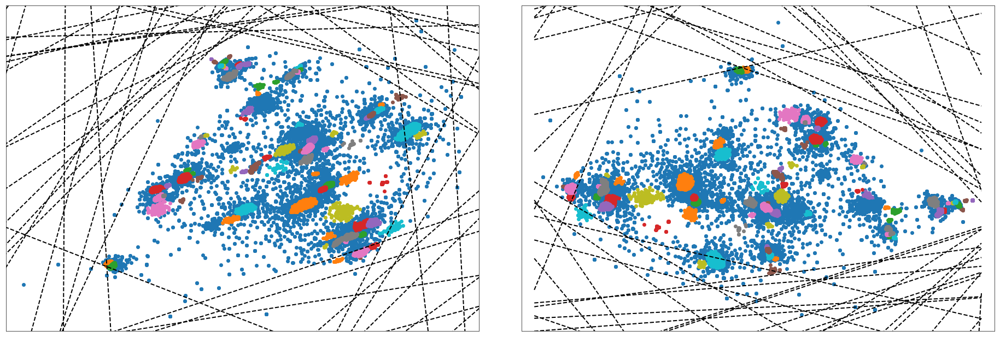

In [66]:
for name, algorithm in [clustering_algorithms[6]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [67]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by HDBSCAN for n_clusters 50
n_clusters orignial 100
n_clusters detected 87
n unclustered points 8557 out of 60000
Clustering using HDBSCAN, time elapesd 1.0603396892547607
Clustering Accuracy 0.08560931516435667
Clustering purity 0.09241296191901717
Clustering homogeneity 0.15143319432143393
Clustering adjusted_rand_score 0.02456339490285872
Clustering adjusted_mutual_info_score 0.1349073928962343
Clustering completeness_score 0.1771721191971042
Clustering v_measure_score 0.1632946203300011


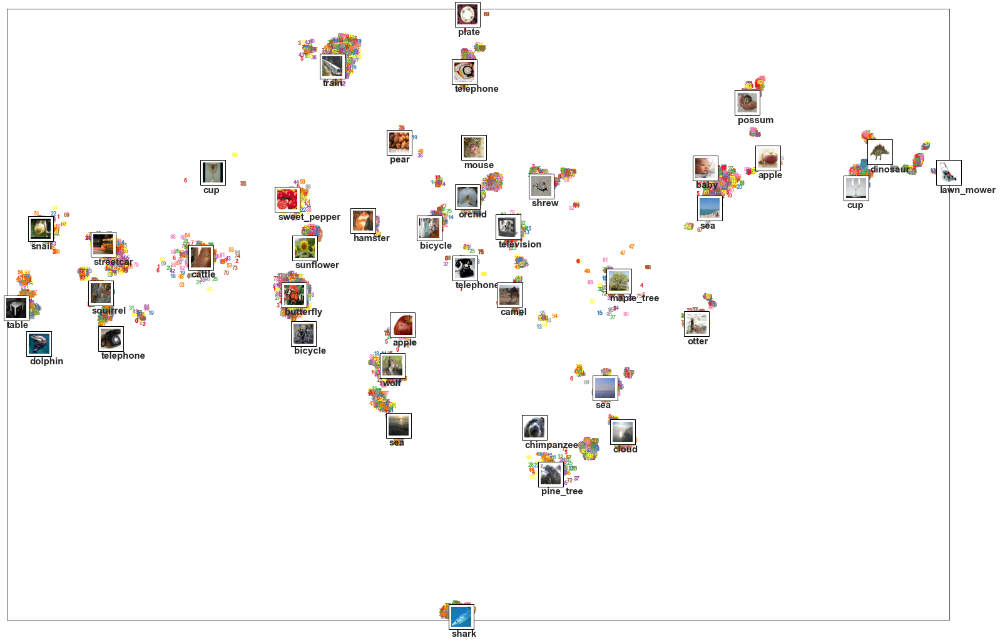

In [68]:
plot_dataset(Z_embedded[y_pred!=-1], y[y_pred!=-1],images=imgs[y_pred!=-1], labels=labels)

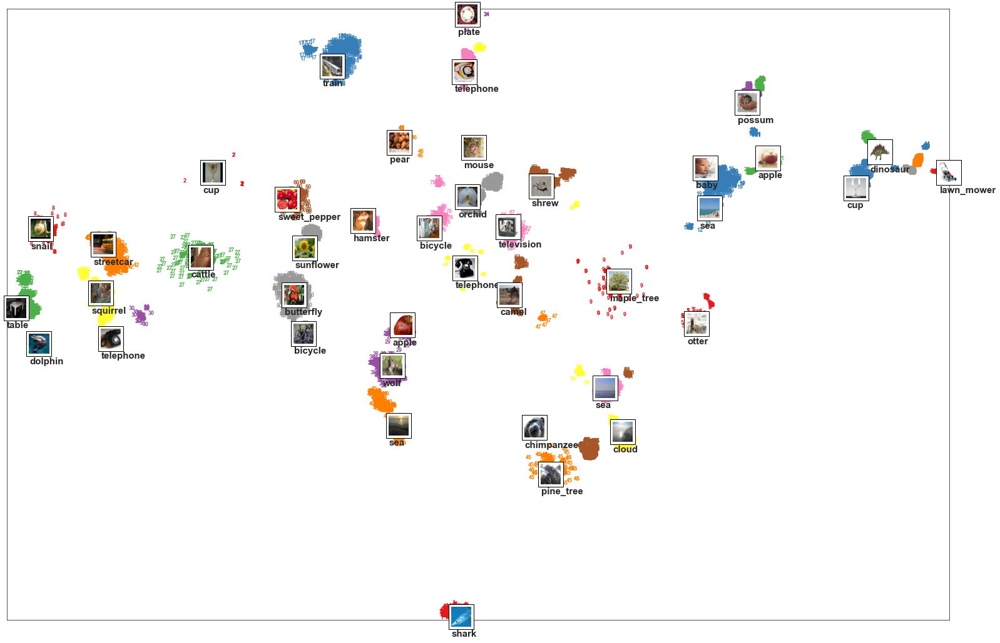

In [69]:
plot_dataset(Z_embedded[y_pred!=-1], y_pred[y_pred!=-1],images=imgs[y_pred!=-1], y_original=y[y_pred!=-1], labels=labels)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13340979336352857
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.1380362731566977


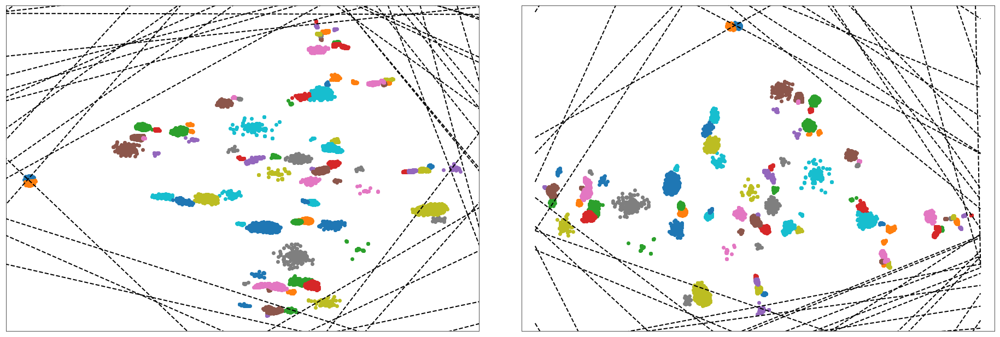

In [70]:
plot_transform_hyperplanes(Z_embedded[y_pred!=-1], pd.get_dummies(y_pred[y_pred!=-1]).values)
    

In [71]:
embedding_Z_space = {'X': X[y_pred!=-1], 
                     'Z': Z_embedded[y_pred!=-1], 
                     'y_cluster': y_pred[y_pred!=-1],
                     'y_original': y[y_pred!=-1],
                     'images': imgs[y_pred!=-1],
                     'labels': labels
                    } 

In [72]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(embedding_Z_space, f, pickle.HIGHEST_PROTOCOL)
    